## **Convolutional neural networks for segmentation tasks**

**Purpose of the work:** To use convolutional neural networks (CNNs) for segmentation tasks. Consider classical CNN architectures for segmentation and use the learned tools.



1. [Download the dataset](https://datasetninja.com/cat)
2. Perform preliminary analysis of the dataset
3. Use augmentation. Answer whether augmentation is critically important for your task.
4. Perform segmentation using a pre-trained DeepLab. Evaluate segmentation using mean IoU and mean Dice metrics.
5. Choose an architecture for your segmentation task (U-Net, FCN, PSPNet). For the chosen architecture, build two models:

   1. Use a pre-trained backbone network for downsampling
   2. Build a downsampling model using Sequential
6. Evaluate segmentation using mean IoU and mean Dice metrics. Summarize results in a table. Display segmentation examples. Compare models and draw conclusions. Answer how segmentation could be improved.
7. Apply the [SAM](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-segment-anything-with-sam.ipynb) model to your task. Visually assess the results.


## **Procedure of the work**

### **Import of necessary libraries**

In [ ]:
pip install dataset_tools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 3.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.2/125.2 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 33.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.8/164.8 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.9/140.9 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 43.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 48.8 MB/s et

In [ ]:
pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 12.6 MB/s eta 0:00:00


In [ ]:
pip install segment_anything

In [ ]:
import dataset_tools as dtools
import os
import random
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
import torch.nn.functional as F
import numpy as np
import json
import base64
import cv2
import supervisely as sly
import zlib
import albumentations as A
from tqdm import tqdm
from PIL import Image
from torchvision import transforms, models
from sklearn.metrics import jaccard_score, f1_score
from io import BytesIO
from torch.utils.data import DataLoader, Dataset
from torchvision.models.segmentation import DeepLabV3_ResNet101_Weights
from torchmetrics import JaccardIndex
from torchmetrics.classification import Dice
from tqdm.auto import tqdm
from torchvision.models import segmentation
from albumentations.pytorch import ToTensorV2
from segment_anything import SamPredictor, sam_model_registry


### **1. Dataset loading**

In [ ]:
dtools.download(dataset='CaT', dst_dir='~/dataset-ninja/')

Unpacking 'cat.tar': 100%|██████████| 3627/3627 [00:08<00:00, 418.02file/s]


'/root/dataset-ninja/cat'

In [ ]:
dataset_path = '/root/dataset-ninja/cat'
train_path = "/root/dataset-ninja/cat/train/"
test_path = "/root/dataset-ninja/cat/test/"

### **2. ПPreliminary analysis of the dataset**

#### **2.1. Folder contents**

In [ ]:
print(os.listdir(dataset_path))

['test', 'train', 'README.md', 'meta.json', 'LICENSE.md']


#### **2.2. README and metadata**

In [ ]:
# README
with open('/root/dataset-ninja/cat/README.md', 'r') as f:
    print(f.read())

import json
with open('/root/dataset-ninja/cat/meta.json', 'r') as f:
    metadata = json.load(f)
    print(json.dumps(metadata, indent=4))


# CaT: CAVS Traversability Dataset for Off-Road Autonomous Driving

CaT is a dataset for semantic segmentation task.
{
    "classes": [
        {
            "title": "off road",
            "shape": "bitmap",
            "color": "#FF0000",
            "geometry_config": {},
            "id": 52307,
            "hotkey": ""
        },
        {
            "title": "pickup",
            "shape": "bitmap",
            "color": "#008000",
            "geometry_config": {},
            "id": 52308,
            "hotkey": ""
        },
        {
            "title": "sedan",
            "shape": "bitmap",
            "color": "#1E90FF",
            "geometry_config": {},
            "id": 52309,
            "hotkey": ""
        }
    ],
    "tags": [
        {
            "name": "brown_field",
            "value_type": "none",
            "color": "#8A300F",
            "id": 16584,
            "hotkey": "",
            "applicable_type": "all",
            "classes": []
        },
      

#### **2.3. Number of images**

In [ ]:
def count_images_in_directory(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        count += len([file for file in files if file.endswith(('png'))])
    return count

train_image_count = count_images_in_directory(train_path)
test_image_count = count_images_in_directory(test_path)

print(f"Train images: {train_image_count}")
print(f"Test images: {test_image_count}")


Train images: 1268
Test images: 544


#### **2.4. Image sizes**

In [ ]:
def find_unique_image_sizes(directory):
    image_sizes = set()
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith(('png')):
                image_path = os.path.join(root, file)
                img = Image.open(image_path)
                image_sizes.add(img.size)
    return image_sizes

train_image_sizes = find_unique_image_sizes(train_path)
test_image_sizes = find_unique_image_sizes(test_path)

print(f"Unique image sizes in train: {train_image_sizes}")
print(f"Unique image sizes in test: {test_image_sizes}")


Unique image sizes in train: {(720, 452), (1024, 644), (960, 604), (1920, 1208)}
Unique image sizes in test: {(720, 452), (1024, 644), (960, 604), (1920, 1208)}


In [ ]:
train_path = '/root/dataset-ninja/cat/train/'
test_path = '/root/dataset-ninja/cat/test/'

def create_image_size_dict(directory):
    image_size_dict = {}
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith(('png')):
                image_path = os.path.join(root, file)
                img = Image.open(image_path)
                image_size_dict[file] = img.size
    return image_size_dict

train_image_sizes = create_image_size_dict(train_path)
test_image_sizes = create_image_size_dict(test_path)
image_sizes = {**train_image_sizes, **test_image_sizes}

#### **2.5. Dataset structure**

In [ ]:
def count_images_in_folder(path):
    image_count = 0
    for root, dirs, files in os.walk(path):
        image_count += len([file for file in files if file.endswith(('png'))])
    return image_count

def print_folder_tree(path, level=0):
    indent = ' ' * 8 * level
    total_images = count_images_in_folder(path)
    print(f"{indent}{os.path.basename(path)}/ ({total_images} зображень)")

    for dir_name in sorted(os.listdir(path)):
        full_path = os.path.join(path, dir_name)
        if os.path.isdir(full_path):
            print_folder_tree(full_path, level + 1)

print(f"Структура датасету '{os.path.basename(dataset_path)}':\n")
print_folder_tree(dataset_path)


Структура датасету 'cat':

cat/ (1812 зображень)
        test/ (544 зображень)
                ann/ (0 зображень)
                img/ (544 зображень)
        train/ (1268 зображень)
                ann/ (0 зображень)
                img/ (1268 зображень)


#### **2.6. General information**

In [ ]:
input = "/root/dataset-ninja/cat"
output = "./results"
os.makedirs(output, exist_ok=True)

# Creating Supervisely project from local directory.
project = sly.Project(input, sly.OpenMode.READ)
print("Opened project: ", project.name)
print("Number of images in project:", project.total_items)

# Showing annotations tags and classes.
print(project.meta)

# Iterating over classes in project, showing their names, geometry types and colors.
for obj_class in project.meta.obj_classes:
    print(
        f"Class '{obj_class.name}': geometry='{obj_class.geometry_type}', color='{obj_class.color}'",
    )

# Iterating over tags in project, showing their names and colors.
for tag in project.meta.tag_metas:
    print(f"Tag '{tag.name}': color='{tag.color}'")

print("Number of datasets (aka folders) in project:", len(project.datasets))

progress = tqdm(project.datasets, desc="Processing datasets")
for dataset in project.datasets:
    # Iterating over images in dataset, using the paths to the images and annotations.
    for item_name, image_path, ann_path in dataset.items():
        # print(f"Item '{item_name}': image='{image_path}', ann='{ann_path}'")

        ann_json = json.load(open(ann_path))
        ann = sly.Annotation.from_json(ann_json, project.meta)

        img = sly.image.read(image_path)  # rgb - order

        for label in ann.labels:
            # Drawing each label on the image.
            label.draw(img)

        res_image_path = os.path.join(output, item_name)
        sly.image.write(res_image_path, img)

        # Or alternatively draw annotation (all labels at once) preview with
        ann.draw_pretty(img, output_path=res_image_path)

        progress.update(1)

Opened project:  cat
Number of images in project: 1812
ProjectMeta:
Object Classes
+----------+--------+----------------+--------+
|   Name   | Shape  |     Color      | Hotkey |
+----------+--------+----------------+--------+
| off road | Bitmap |  [255, 0, 0]   |        |
|  pickup  | Bitmap |  [0, 128, 0]   |        |
|  sedan   | Bitmap | [30, 144, 255] |        |
+----------+--------+----------------+--------+
Tags
+-------------+------------+-----------------+--------+---------------+--------------------+
|     Name    | Value type | Possible values | Hotkey | Applicable to | Applicable classes |
+-------------+------------+-----------------+--------+---------------+--------------------+
| brown_field |    none    |       None      |        |      all      |         []         |
|  main_trail |    none    |       None      |        |      all      |         []         |
|  power_line |    none    |       None      |        |      all      |         []         |
+-------------+---

Processing datasets:   0%|          | 0/2 [00:00<?, ?it/s]

### **Data preparation**

#### **Create the corresponding class and define the main functions**

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, imagePath, annotationPath, transform=None, augmentations=None):
        self.imagePath = imagePath
        self.annotationPath = annotationPath
        self.transform = transform
        self.augmentations = augmentations
        self.imageFiles = os.listdir(imagePath)
        #self.imageFiles = [f for f in os.listdir(imagePath) if f.endswith('.png')]

    def getName(self, idx):
        imgName = os.path.join(self.imagePath, self.imageFiles[idx])
        return imgName

    def __len__(self):
        return len(self.imageFiles)

    def create_mask_from_json(self, maskName):
        image_height = maskName["size"].get("height")
        image_width = maskName["size"].get("width")

        mask_class = np.zeros((image_height, image_width), dtype=np.uint8)
        mask_color = np.zeros((image_height, image_width, 3), dtype=np.uint8)

        class_info = {
        "sedan": {"id": 1, "color": [255, 0, 0]},
        "pickup": {"id": 2, "color": [0, 255, 0]},
        "off road": {"id": 3, "color": [0, 0, 255]},
        }

        for obj in maskName["objects"]:
            class_title = obj["classTitle"]
            class_data = class_info.get(class_title, {"id": 0, "color": [0, 0, 0]})
            class_id = class_data["id"]
            color = class_data["color"]
            bitmap_info = obj["bitmap"]

            bitmap_data_base64 = bitmap_info["data"]
            origin = bitmap_info["origin"]
            origin_x, origin_y = origin

            try:
                compressed_data = base64.b64decode(bitmap_data_base64)
            except base64.binascii.Error as e:
                print("Помилка декодування Base64:", e)
                continue

            try:
                decompressed_data = zlib.decompress(compressed_data)
            except zlib.error as e:
                print("Помилка розпакування даних:", e)
                continue

            try:
                bitmap_image = Image.open(BytesIO(decompressed_data))
            except IOError as e:
                print("Помилка відкриття зображення:", e)
                continue

            bitmap_data = np.array(bitmap_image)
            mask_height, mask_width = bitmap_data.shape[:2]

            end_y = min(origin_y + mask_height, image_height)
            end_x = min(origin_x + mask_width, image_width)

            mask_class[origin_y:end_y, origin_x:end_x] = np.where(
            bitmap_data[0:(end_y - origin_y), 0:(end_x - origin_x)] > 0,
            class_id,
            mask_class[origin_y:end_y, origin_x:end_x]
            )


            for c in range(3):
                mask_color[origin_y:end_y, origin_x:end_x, c] = np.where(
                bitmap_data[0:(end_y - origin_y), 0:(end_x - origin_x)] > 0,
                color[c],
                mask_color[origin_y:end_y, origin_x:end_x, c]
            )

        return mask_color, mask_class

    def __getitem__(self, idx):
        imgName = os.path.join(self.imagePath, self.imageFiles[idx])
        try:
            image = Image.open(imgName).convert("RGB")
        except Exception as e:
            print(f"Помилка при відкритті зображення: {imgName}, помилка: {e}")

        annotationName = os.path.join(self.annotationPath , self.imageFiles[idx] + ".json")         #+ "/" +
        try:
            #print(annotationName)
            with open(annotationName) as f:
                json_data = json.load(f)
            mask_color, mask_class = self.create_mask_from_json(json_data)

        except Exception as e:
            print(f"Помилка при відкритті зображення: {annotationName}, помилка: {e}")

        if self.augmentations:
            image = np.array(image)
            mask_color = np.array(mask_color)
            mask_class = np.array(mask_class)
            augmented = self.augmentations(image=image, masks=[mask_class, mask_color])
            image = augmented['image']
            mask_class = augmented['masks'][0]
            mask_color = augmented['masks'][1]

        if self.transform:
            image = self.transform(image)
            mask_color = Image.fromarray(mask_color)
            mask_class = Image.fromarray(mask_class)

            mask_color = self.transform(mask_color)
            mask_class = self.transform(mask_class)


        return image, mask_color, mask_class

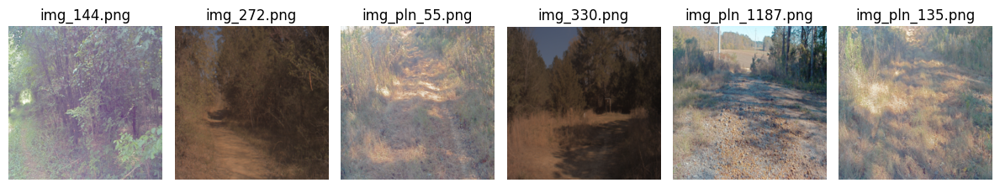

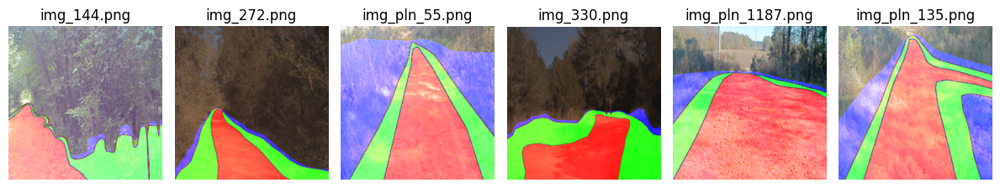

In [ ]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

train = CustomDataset('/root/dataset-ninja/cat/train/img', '/root/dataset-ninja/cat/train/ann', transform=transform)
test = CustomDataset('/root/dataset-ninja/cat/test/img', '/root/dataset-ninja/cat/test/ann', transform=transform)
trainLoader = DataLoader(train, batch_size=1, shuffle=True)
testLoader = DataLoader(test, batch_size=1, shuffle=True)

def printImage(dataset, numImage, width, height, row, colum):
    plt.figure(figsize=(width, height))
    for i in range(numImage):
        plt.subplot(row, colum, i + 1)
        image, mask_color, mask_class = dataset[i]
        plt.imshow(image.permute(1, 2, 0).numpy())
        plt.title(os.path.basename(dataset.getName(i)))
        plt.axis("off")

    plt.tight_layout()
    plt.show()

def printImageAndMask(dataset, numImage, width, height, row, colum):
    plt.figure(figsize=(width, height))
    for i in range(numImage):
        plt.subplot(row, colum, i + 1)
        image, mask_color, mask_class = dataset[i]
        image_np = image.permute(1, 2, 0).numpy()
        mask_np = mask_color.permute(1, 2, 0).numpy()
        overlay = np.where(mask_np > 0, mask_np, image_np)
        plt.imshow(overlay)
        plt.title(os.path.basename(dataset.getName(i)))
        plt.axis("off")
    plt.tight_layout()
    plt.show()
printImage(train, 6, 12, 6, 1, 6)
printImageAndMask(train, 6, 12, 6, 1, 6)

#### **For model**

In [ ]:
def learn_model(model, num_epochs, criterion, optimizer, train, validation, dict = True):
    for epoch in tqdm(range(num_epochs), desc="Training Progress"):

        model.train()
        running_loss = 0.0

        for images, mask_color, mask_class in tqdm(train, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False):

            # Ensure mask_class has shape [batch_size, height, width] + int
            mask_class = (mask_class * 255.0).squeeze(1).long()

            images = images.to(device)
            mask_class = mask_class.to(device)

            optimizer.zero_grad()

            outputs = model(images)

            if(dict):
                loss = criterion(outputs['out'], mask_class)
            else:
                loss = criterion(outputs, mask_class)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_train_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}")


        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, mask_color, mask_class in tqdm(validation, desc="Validation", leave=False):

                # Ensure mask_class has shape [batch_size, height, width] + int
                mask_class = (mask_class * 255.0).squeeze(1).long()

                images = images.to(device)
                mask_class = mask_class.to(device)

                outputs = model(images)

                if(dict):
                    loss = criterion(outputs['out'], mask_class)
                else:
                    loss = criterion(outputs, mask_class)

                val_loss += loss.item()

        avg_val_loss = val_loss / len(validation)
        print(f"Epoch [{epoch+1}/{num_epochs}], Validation Loss: {avg_val_loss:.4f}")

    print("Навчання завершено")

In [ ]:
batch_size = 16

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

train_dataset = CustomDataset('/root/dataset-ninja/cat/train/img', '/root/dataset-ninja/cat/train/ann', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = CustomDataset('/root/dataset-ninja/cat/test/img', '/root/dataset-ninja/cat/test/ann', transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
class_colors = {
    0: [0, 0, 0],
    1: [255, 0, 0],  # "sedan"
    2: [0, 255, 0],  # "pickup"
    3: [0, 0, 255],  # "off road"
}

def visualize_predictions(model, dataloader, num_images=2, dict = True):
    model.eval()
    images_shown = 0

    with torch.no_grad():
        for images, mask_color, mask_class in dataloader:
            images = images.to(device)
            mask_class = mask_class.squeeze(1).to(device)

            outputs = model(images)

            if(dict):
                preds = outputs['out'].argmax(1)
            else:
                preds = outputs.argmax(1)

            images = images.cpu()
            mask_class = mask_class.cpu()
            preds = preds.cpu()

            preds_color = np.zeros((preds.shape[0], preds.shape[1], preds.shape[2], 3), dtype=np.uint8)
            for class_id, color in class_colors.items():
                preds_color[preds == class_id] = color

            for i in range(min(num_images, images.shape[0])):
                fig, axes = plt.subplots(1, 3, figsize=(15, 5))

                axes[0].imshow(np.transpose(images[i].numpy(), (1, 2, 0)))
                axes[0].set_title("Original Image")
                axes[0].axis("off")

                axes[1].imshow(mask_color[i].permute(1, 2, 0))
                axes[1].set_title("True Mask")
                axes[1].axis("off")

                axes[2].imshow(preds_color[i], cmap="gray")
                axes[2].set_title("Predicted Mask")
                axes[2].axis("off")

                plt.show()

                images_shown += 1
                if images_shown >= num_images:
                    return

In [ ]:
def compute_metrics(model, data, num_classes=4, dict = True):
    count = len(data)
    iou_metric = JaccardIndex(task="multiclass", num_classes=num_classes).to(device)
    dice_metric = Dice(num_classes=num_classes).to(device)
    iou = 0
    dice = 0
    for images, mask_color, mask_class in tqdm(data, total=count):
        with torch.no_grad():
            images = images.to(device)
            mask_class = mask_class.squeeze(1).to(device).long()
            outputs = model(images)

            if(dict):
                preds = outputs['out'].argmax(1)
            else:
                preds = outputs.argmax(1)

            iou += iou_metric(preds, mask_class).item()
            dice += dice_metric(preds, mask_class).item()

    print("Mean IoU:", iou / count)
    print("Mean Dice:", dice / count)

### **3. Augmentation**

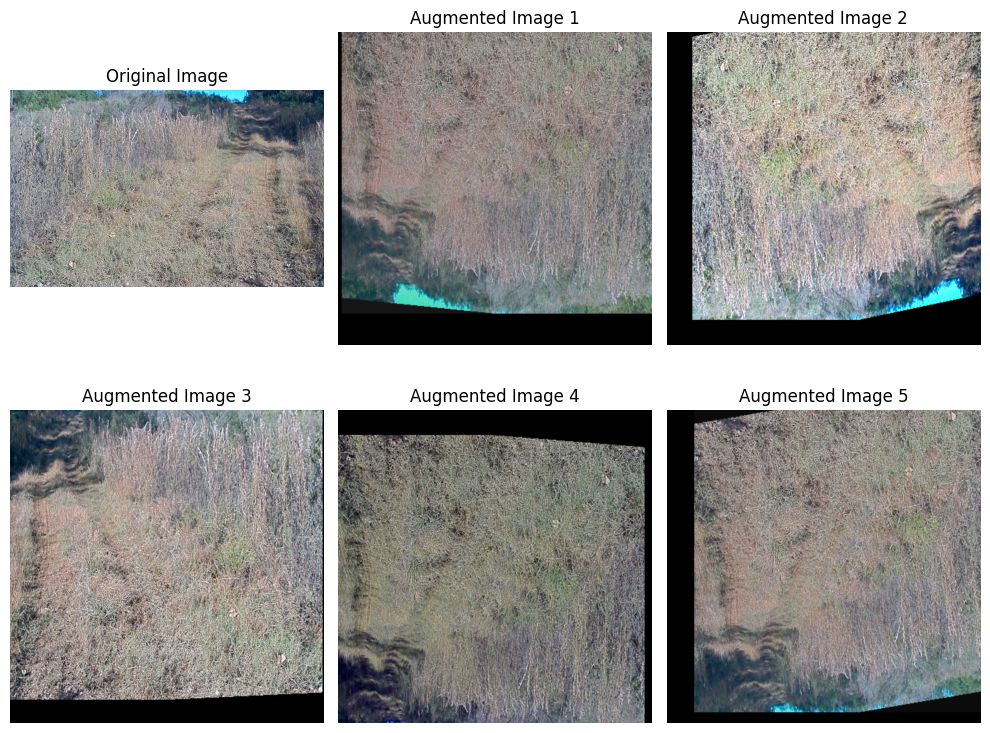

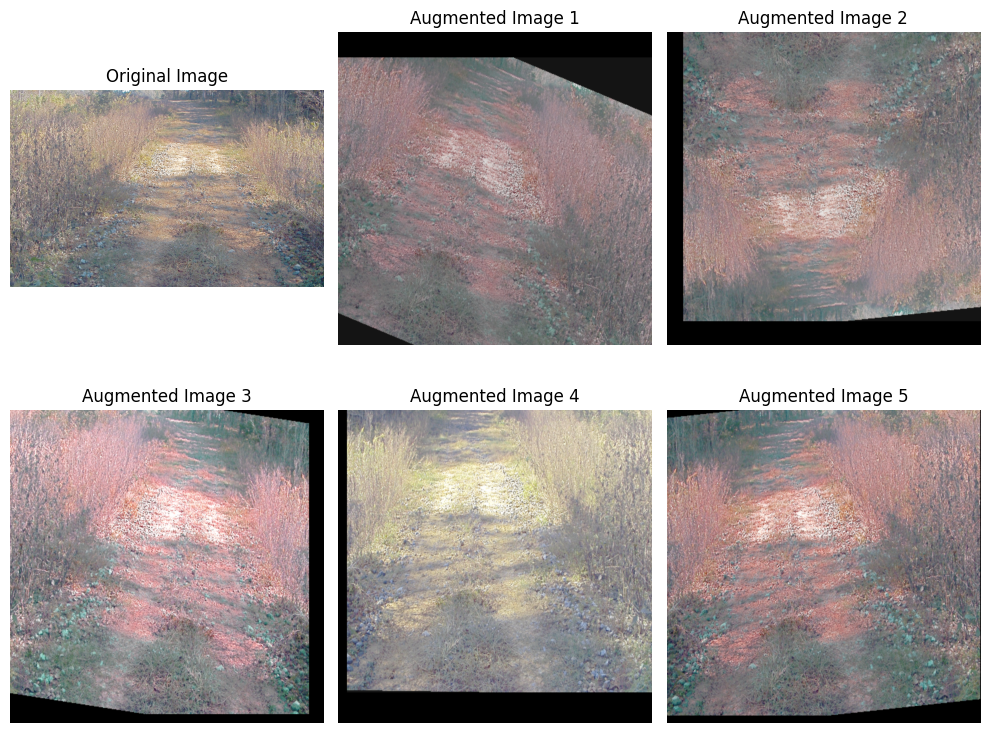

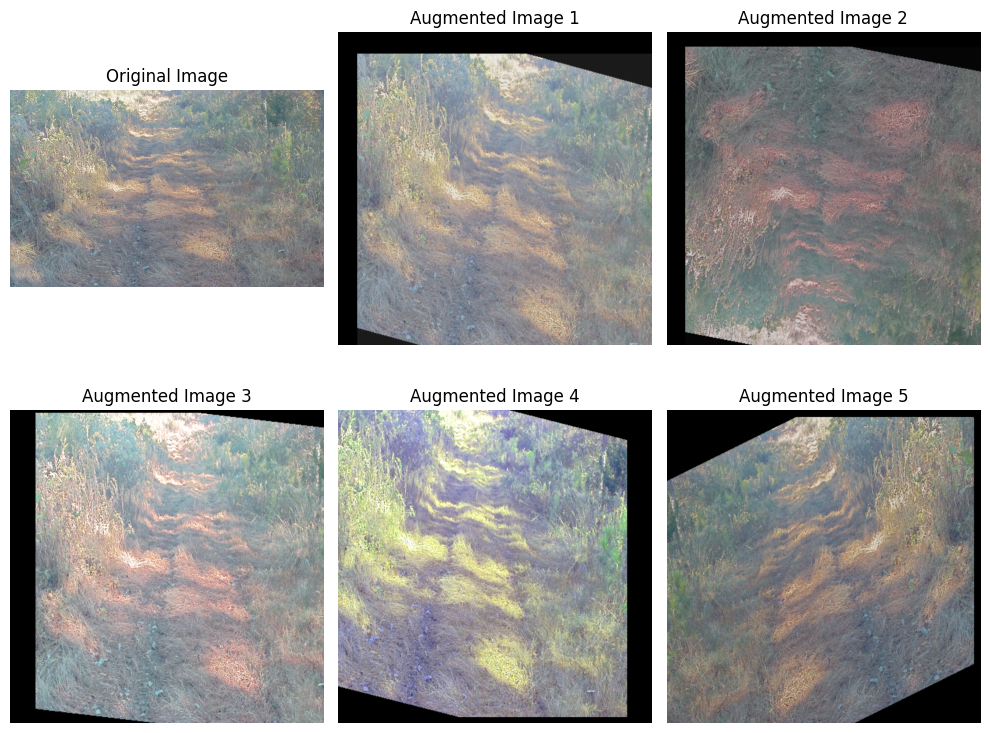

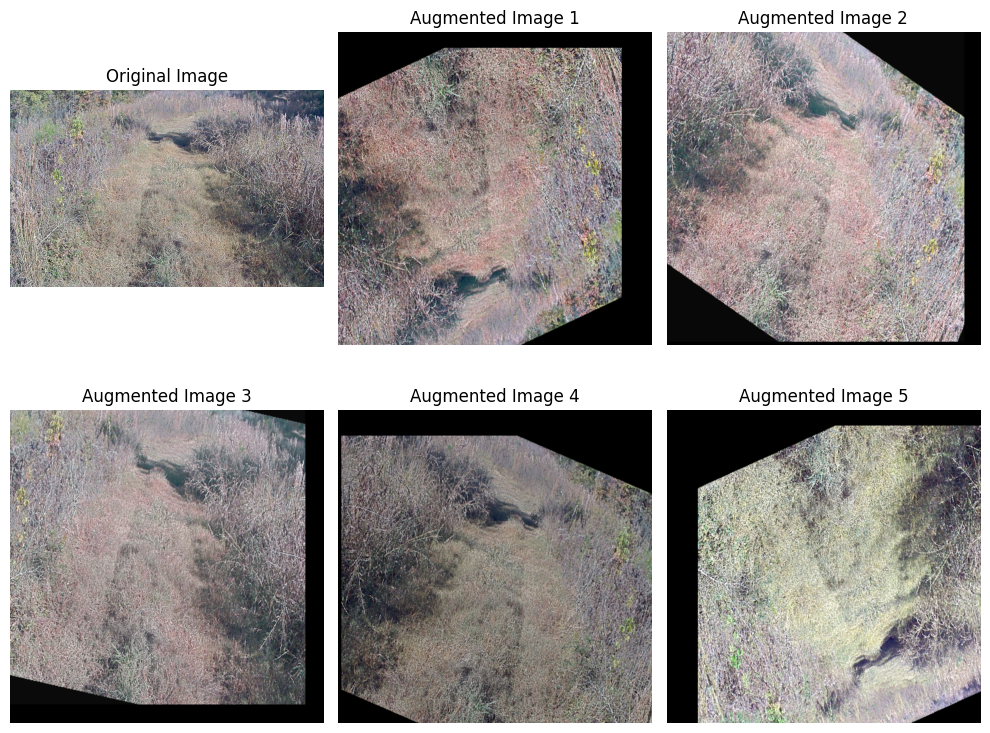

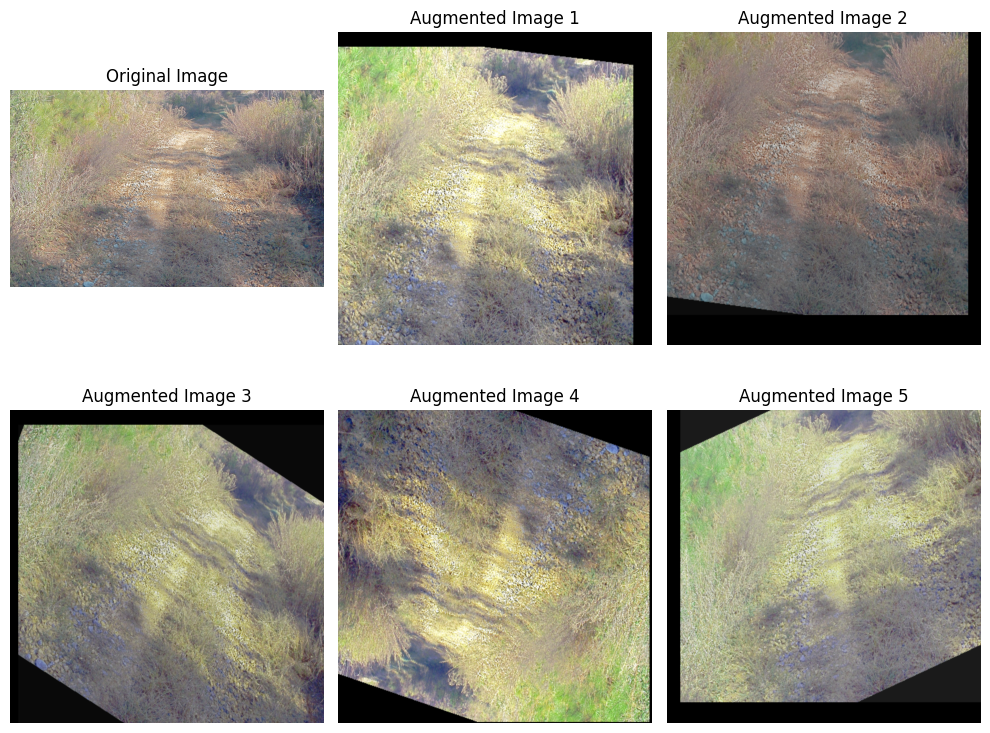

In [ ]:
def augment_image(image):
    augmentations = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(30),
        transforms.ColorJitter(brightness=0.2,
                                contrast=0.2,
                                saturation=0.2,
                                hue=0.1),
        transforms.RandomResizedCrop(4000, scale=(0.8, 1.0)),
        transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    ])
    return augmentations(image)

train_img_path = '/root/dataset-ninja/cat/train/img/'

image_files = [f for f in os.listdir(train_img_path) if f.endswith('.png') or f.endswith('.jpg')]

random_image_files = random.sample(image_files, min(5, len(image_files)))

for img_file in random_image_files:
    img_path = os.path.join(train_img_path, img_file)

    img = Image.open(img_path).convert('RGB')

    augmented_images = [augment_image(img) for _ in range(5)]

    plt.figure(figsize=(10, 8))

    plt.subplot(2, 3, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')

    for j, aug_img in enumerate(augmented_images):
        plt.subplot(2, 3, j + 2)
        plt.imshow(aug_img)
        plt.title(f"Augmented Image {j + 1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


### **4. Segmentation using DeepLab**

#### **Load the DeepLabv3 model with ResNet50**

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

modelDeepLab = models.segmentation.deeplabv3_mobilenet_v3_large(weights="DEFAULT")
modelDeepLab.classifier[4] = nn.Conv2d(256, 4, kernel_size=(1, 1), stride=(1, 1))
modelDeepLab = modelDeepLab.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(modelDeepLab.parameters(), lr=0.001)

for param in modelDeepLab.backbone.parameters():
    param.requires_grad = False

trainable_params = sum(p.numel() for p in modelDeepLab.parameters() if p.requires_grad)
print(f"Trainable parameters: {trainable_params}")

Downloading: "https://download.pytorch.org/models/deeplabv3_mobilenet_v3_large-fc3c493d.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_mobilenet_v3_large-fc3c493d.pth
Processing: 100%|██████████| 42.3M/42.3M [00:00<00:00, 61.0MB/s]


Trainable parameters: 8053007


#### **Model training**

In [ ]:
learn_model(modelDeepLab, 5, criterion, optimizer, train_loader, test_loader)

Training Progress:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [1/5], Training Loss: 0.5716


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [1/5], Validation Loss: 0.7399


Epoch 2/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [2/5], Training Loss: 0.4415


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [2/5], Validation Loss: 0.5492


Epoch 3/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [3/5], Training Loss: 0.3895


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [3/5], Validation Loss: 0.4481


Epoch 4/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [4/5], Training Loss: 0.3474


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [4/5], Validation Loss: 0.4062


Epoch 5/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [5/5], Training Loss: 0.3108


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [5/5], Validation Loss: 0.3695
Навчання завершено


#### **Results**

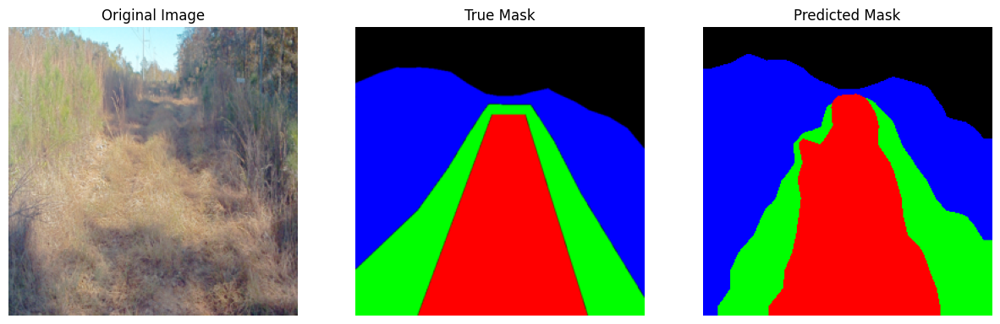

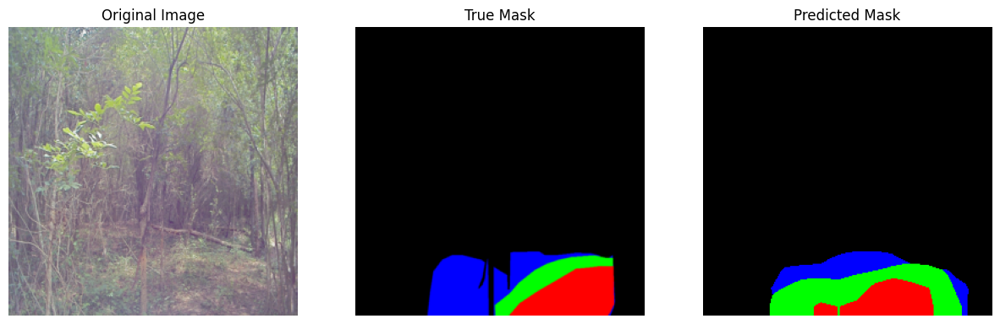

In [ ]:
visualize_predictions(modelDeepLab, test_loader, num_images=2)

In [ ]:
compute_metrics(modelDeepLab, test_loader)

  0%|          | 0/34 [00:00<?, ?it/s]

Mean IoU: 0.08016011995427749
Mean Dice: 0.32064047981710997


### **5. U-Net**

#### **Model 1: use a pre-trained backbone network for downsampling**

##### **Functions and class, model loading**

In [ ]:
class UNet(nn.Module):
    def __init__(self, n_class=4):
        super().__init__()

        # Encoder
        self.e11 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.e12 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.e21 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.e22 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.e31 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.e32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.e41 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.e42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.e51 = nn.Conv2d(512, 1024, kernel_size=3, padding=1)
        self.e52 = nn.Conv2d(1024, 1024, kernel_size=3, padding=1)


        # Decoder
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.d11 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.d12 = nn.Conv2d(512, 512, kernel_size=3, padding=1)

        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.d21 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.d22 = nn.Conv2d(256, 256, kernel_size=3, padding=1)

        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.d31 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.d32 = nn.Conv2d(128, 128, kernel_size=3, padding=1)

        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.d41 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.d42 = nn.Conv2d(64, 64, kernel_size=3, padding=1)

        # Output layer
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        # Encoder
        xe11 = F.relu(self.e11(x))
        xe12 = F.relu(self.e12(xe11))
        xp1 = self.pool1(xe12)

        xe21 = F.relu(self.e21(xp1))
        xe22 = F.relu(self.e22(xe21))
        xp2 = self.pool2(xe22)

        xe31 = F.relu(self.e31(xp2))
        xe32 = F.relu(self.e32(xe31))
        xp3 = self.pool3(xe32)

        xe41 = F.relu(self.e41(xp3))
        xe42 = F.relu(self.e42(xe41))
        xp4 = self.pool4(xe42)

        xe51 = F.relu(self.e51(xp4))
        xe52 = F.relu(self.e52(xe51))

        # Decoder
        xu1 = self.upconv1(xe52)
        xu11 = torch.cat([xu1, xe42], dim=1)
        xd11 = F.relu(self.d11(xu11))
        xd12 = F.relu(self.d12(xd11))

        xu2 = self.upconv2(xd12)
        xu22 = torch.cat([xu2, xe32], dim=1)
        xd21 = F.relu(self.d21(xu22))
        xd22 = F.relu(self.d22(xd21))

        xu3 = self.upconv3(xd22)
        xu33 = torch.cat([xu3, xe22], dim=1)
        xd31 = F.relu(self.d31(xu33))
        xd32 = F.relu(self.d32(xd31))

        xu4 = self.upconv4(xd32)
        xu44 = torch.cat([xu4, xe12], dim=1)
        xd41 = F.relu(self.d41(xu44))
        xd42 = F.relu(self.d42(xd41))

        # Output layer
        out = self.outconv(xd42)

        return out

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

modelUNet = UNet()
modelUNet = modelUNet.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(modelUNet.parameters(), lr=0.001)

##### **Model training**

In [ ]:
learn_model(modelUNet, 1, criterion, optimizer, train_loader, test_loader, dict=False)

Training Progress:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 1/1:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [1/1], Training Loss: 1.3293


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [1/1], Validation Loss: 1.2620
Навчання завершено


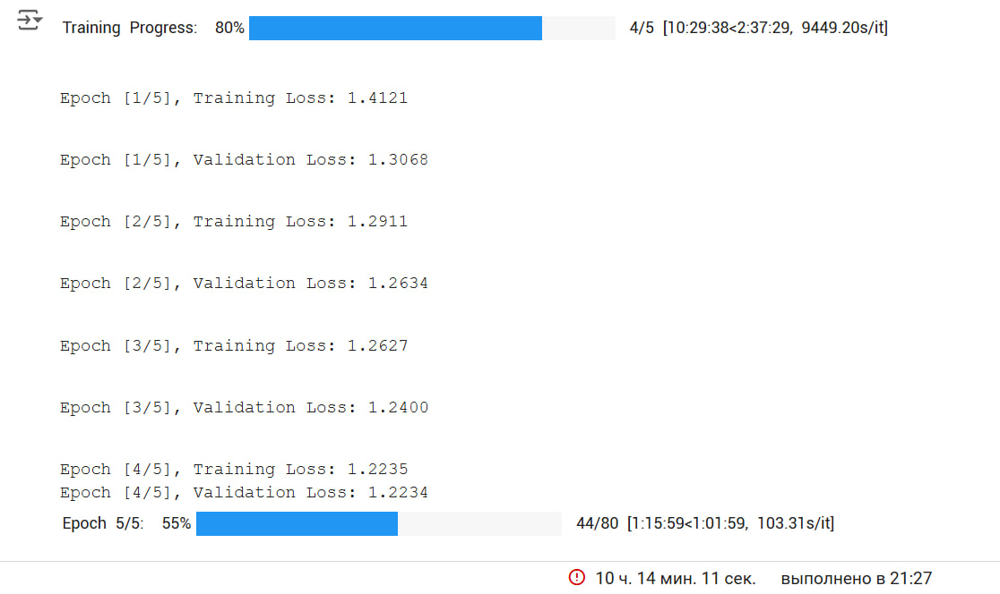

##### **Results**

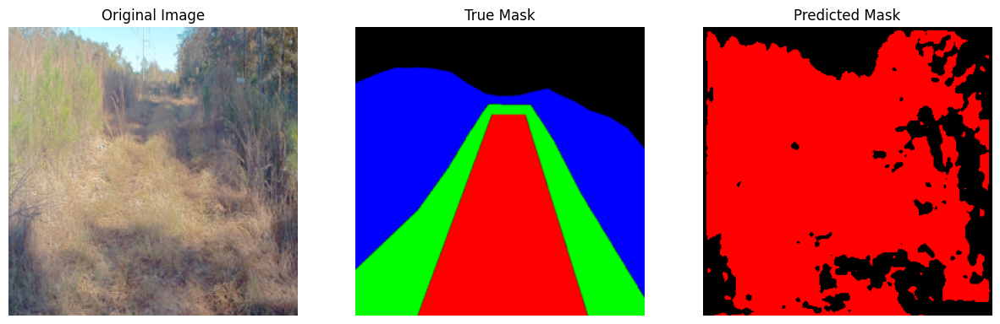

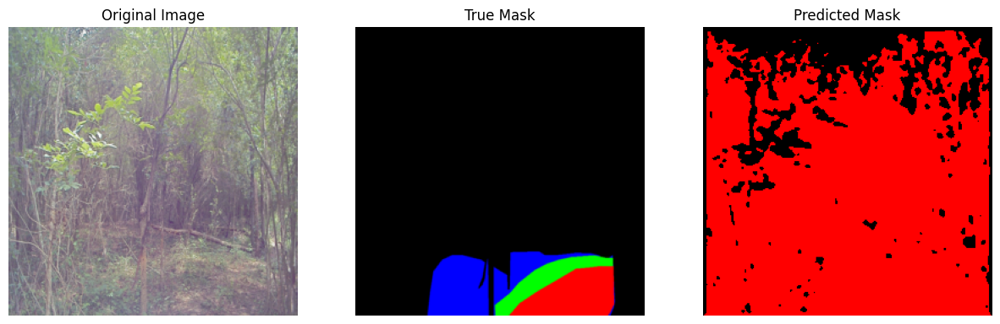

In [ ]:
visualize_predictions(modelUNet, test_loader, num_images=2, dict = False)

In [ ]:
compute_metrics(modelUNet, test_loader, dict = False)

  0%|          | 0/34 [00:00<?, ?it/s]

Mean IoU: 0.20538060805376837
Mean Dice: 0.41076121610753674


#### **Model 2: build the downsampling model using Sequential**

##### **Model loading**

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

modelFcnResnet = segmentation.fcn_resnet101(num_classes=4)
modelFcnResnet.to(device)

for param in modelFcnResnet.backbone.parameters():
    param.requires_grad = False

for param in modelFcnResnet.classifier.parameters():
    param.requires_grad = True

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, modelFcnResnet.parameters()), lr=0.001)

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
Processing: 100%|██████████| 171M/171M [00:01<00:00, 128MB/s]


##### **Model training**

In [ ]:
learn_model(modelFcnResnet, 5, criterion, optimizer, train_loader, test_loader)

Training Progress:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [1/5], Training Loss: 0.7634


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [1/5], Validation Loss: 0.6367


Epoch 2/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [2/5], Training Loss: 0.5902


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [2/5], Validation Loss: 0.5775


Epoch 3/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [3/5], Training Loss: 0.5261


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [3/5], Validation Loss: 0.5109


Epoch 4/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [4/5], Training Loss: 0.4813


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [4/5], Validation Loss: 0.5514


Epoch 5/5:   0%|          | 0/80 [00:00<?, ?it/s]

Epoch [5/5], Training Loss: 0.4573


Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch [5/5], Validation Loss: 0.4980
Навчання завершено


##### **Results**

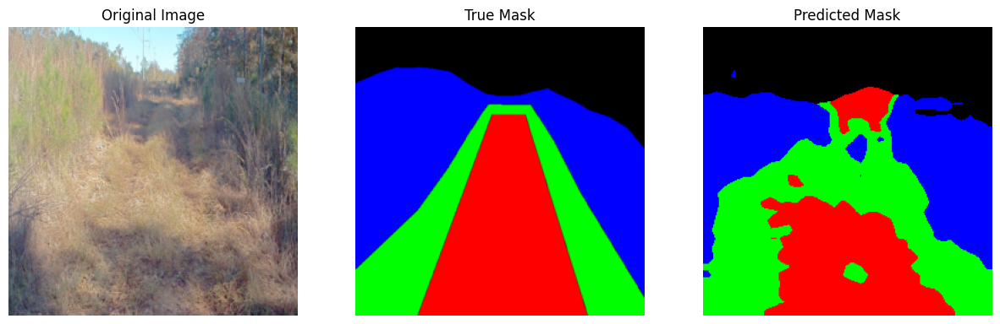

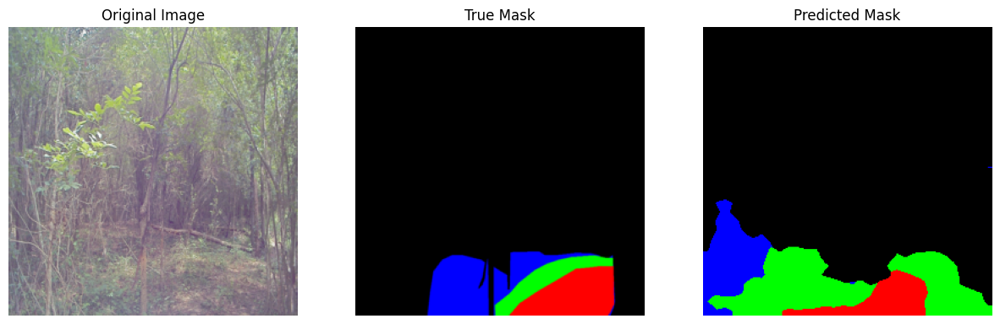

In [ ]:
visualize_predictions(modelFcnResnet, test_loader, num_images=2)

In [ ]:
compute_metrics(modelFcnResnet, test_loader)

  0%|          | 0/34 [00:00<?, ?it/s]

Mean IoU: 0.08049082054811366
Mean Dice: 0.3219632821924546


### **6. Model SAM**

In [ ]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth


--2024-11-16 15:20:38--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.164.78.121, 18.164.78.128, 18.164.78.81, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.164.78.121|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘sam_vit_b_01ec64.pth’

sam_vit_b_01ec64.pt 100%[===================>] 357.67M   134MB/s    in 2.7s    

2024-11-16 15:20:41 (134 MB/s) - ‘sam_vit_b_01ec64.pth’ saved [375042383/375042383]



In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
sam_model = sam_model_registry["vit_b"](checkpoint=r"sam_vit_b_01ec64.pth")
sam_model.to(device)
sam_predictor = SamPredictor(sam_model)

In [ ]:
class_colors = {
    0: [0, 0, 0],
    1: [255, 0, 0],  # "sedan"
    2: [0, 255, 0],  # "pickup"
    3: [0, 0, 255],  # "off road"
}

def visualize_sam_predictions(dataloader, num_images=5):
    images_shown = 0

    for images, mask_color, mask_class in dataloader:
        # Load each image into SAM and generate masks
        for i in range(min(num_images, images.shape[0])):
            image_np = np.transpose(images[i].cpu().numpy(), (1, 2, 0))  # Convert to HWC format for SAM
            sam_predictor.set_image(image_np)  # Set image in SAM predictor

            # Define a prompt, for example, center point
            prompt_points = np.array([[image_np.shape[1] // 2, image_np.shape[0] // 2]])  # Center point prompt
            prompt_labels = np.array([1])  # Label as foreground

            # Predict mask with SAM based on the prompt
            masks, _, _ = sam_predictor.predict(point_coords=prompt_points, point_labels=prompt_labels)
            sam_mask = masks[0]  # Select the first mask (if multiple are predicted)

            # Convert SAM's mask to color based on class_colors dictionary
            preds_color = np.zeros((sam_mask.shape[0], sam_mask.shape[1], 3), dtype=np.uint8)
            for class_id, color in class_colors.items():
                preds_color[sam_mask == class_id] = color

            # Visualize results
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            # Original Image
            axes[0].imshow(image_np)
            axes[0].set_title("Original Image")
            axes[0].axis("off")

            # True Mask (Color)
            true_mask_color = mask_color[i].permute(1, 2, 0)
            axes[1].imshow(true_mask_color)
            axes[1].set_title("True Mask")
            axes[1].axis("off")

            # SAM Predicted Mask
            axes[2].imshow(preds_color)
            axes[2].set_title("SAM Predicted Mask")
            axes[2].axis("off")

            plt.show()

            images_shown += 1
            if images_shown >= num_images:
                return

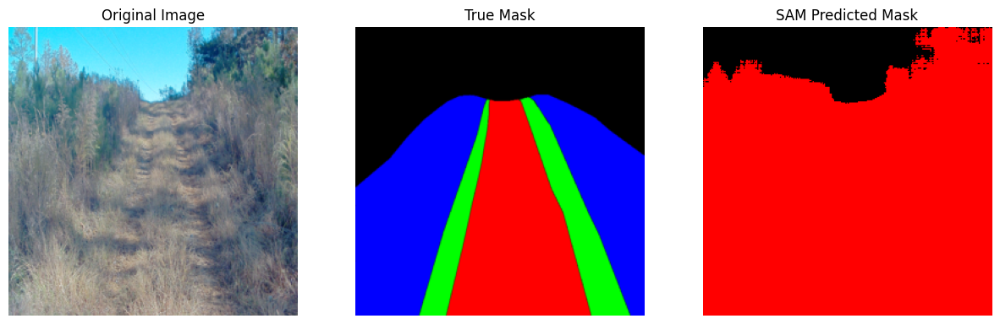

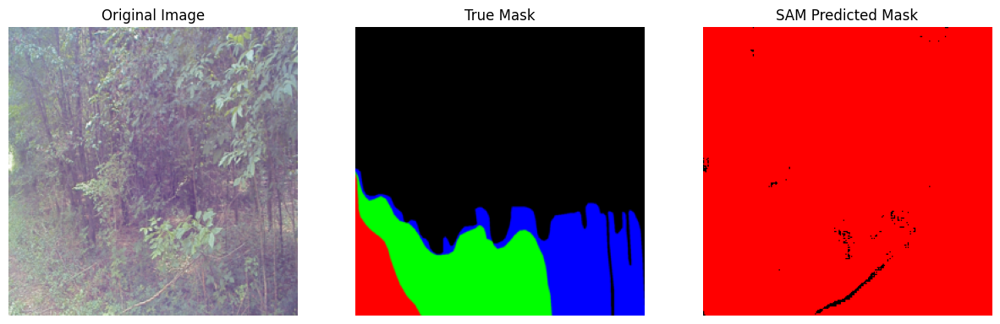

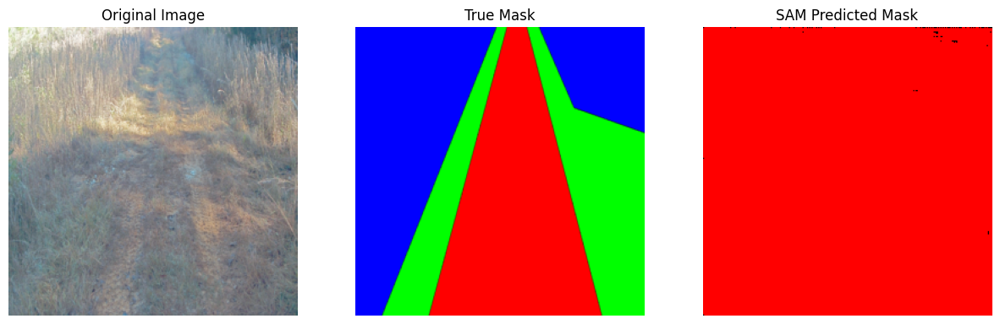

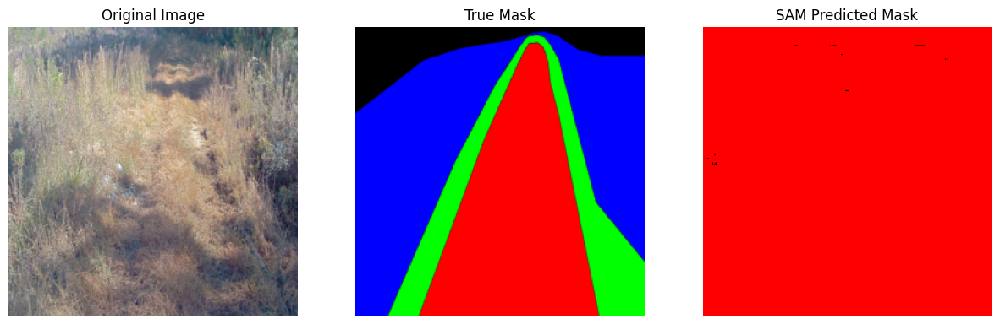

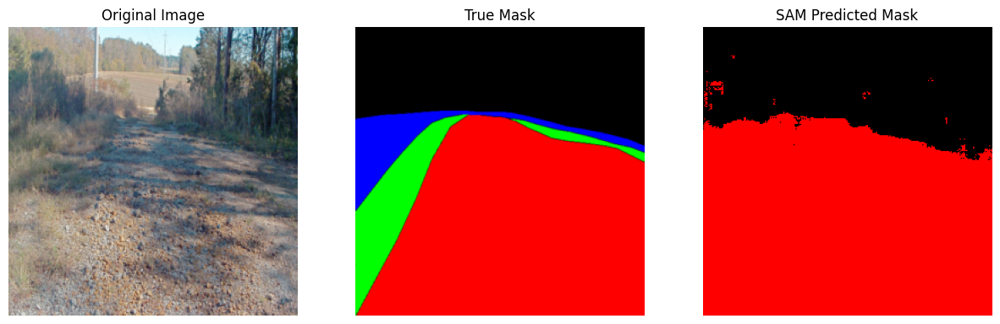

In [ ]:
visualize_sam_predictions(testLoader, num_images=5)

### **7. Conclusions**

In [ ]:
import pandas as pd

data = {
    'Модель': ['DeepLab', 'U-Net (Backbone)', 'U-Net (Sequential)'],
    'Mean IoU': [0.08016011995427749, 0.20538060805376837, 0.08049082054811366],
    'Mean Dice': [0.32064047981710997, 0.41076121610753674, 0.3219632821924546],
    'Training Loss': ['0.3108', '1.3293', '0.4573'],
    'Validation Loss': ['0.3695', '1.2620', '0.4980']
}

df = pd.DataFrame(data)

print("Результати моделей:")
print(df)


Результати моделей:
               Модель  Mean IoU  Mean Dice Training Loss Validation Loss
0             DeepLab  0.080160   0.320640        0.3108          0.3695
1    U-Net (Backbone)  0.205381   0.410761        1.3293          1.2620
2  U-Net (Sequential)  0.080491   0.321963        0.4573          0.4980
